# Livraison

## Importation

In [1]:
# LES ALGORITHMES
from QLearning import *
from DQN import *
from PPO import *
import time

# POUR AFFICHAGE
import matplotlib.pyplot as plt
import seaborn as sns
from helperPlot import *

# POUR ENVIRONNEMENT
import gymnasium
from gymnasium import spaces

## Environnements

Environnement 1 : position et boîte en un unique entier : One Hot Encoding

In [2]:
class LivraisonEnv(gymnasium.Env) :
    def __init__(self, carte) :
        super(LivraisonEnv, self).__init__()
        self.size = len(carte)
        self.action_space = spaces.Discrete(4)
        self.observation_space = spaces.Discrete(2 * (self.size ** 2))
        self.map = carte
        self.state = 0
        self.hasBox = False

    def reset(self, seed = None, options = None) :
        super().reset(seed = seed)
        self.state = 0
        self.hasBox = False
        return self.state, {}

    def step(self, action) :
        x, y = self._stateToCoordinate(self.state)
        if action == 0 : # Left
            if x > 0 :
                x -= 1
        elif action == 1 : # Down
            if y < self.size -1 :
                y += 1
        elif action == 2 : # Right
            if x < self.size -1 :
                x += 1
        elif action == 3 : # Up
            if y > 0 :
                y -= 1
        
        
        result = self.map[y][x]
        
        if result == 'B' :
            self.hasBox = True

        self.state = self._coordinateToState(x, y)

        
        if result == 'G' and self.hasBox :
            reward = 1
            done = True
        elif result == 'H' :
            reward = -1
            done = True
        else :
            reward = -1/(self.size**2)
            done = False
        return self.state, reward, done, False, {}

    
    def _stateToCoordinate(self, state) :
        if state >= self.size ** 2 :
            state -= self.size ** 2
        x = state % self.size
        y = state // self.size
        return x, y

    
    def _coordinateToState(self, x, y) :
        toReturn = self.size*y + x
        if self.hasBox :
            toReturn += self.size ** 2
        return toReturn

    def render(self) :
        x, y = self._stateToCoordinate(self.state)
        toPrint = ''
        for i in range(self.size) :
            toPrintRow = ''
            row = self.map[i]
            for j in range(self.size) :
                if (j, i) == (x, y):
                    toPrintRow += '.'
                else :
                    toPrintRow += row[j]
            toPrint += toPrintRow + '\n'
        print(toPrint)
        if self.state == (self.size**2) - 1 :
            print("Objectif atteint")

Environnement 2 : position et boîte codée différemment : one hot encoding pour les deux

In [3]:
class Livraison2Env(gymnasium.Env) :
    def __init__(self, carte) :
        super(Livraison2Env, self).__init__()
        self.size = len(carte)
        self.action_space = spaces.Discrete(4)
        self.observation_space = spaces.MultiDiscrete([self.size ** 2, 2])
        self.map = carte
        self.state = 0
        self.hasBox = False

    def reset(self, seed = None, options = None) :
        super().reset(seed = seed)
        self.state = 0
        self.hasBox = False
        return [self.state, 0], {}

    def step(self, action) :
        x, y = self._stateToCoordinate(self.state)
        if action == 0 : # Left
            if x > 0 :
                x -= 1
        elif action == 1 : # Down
            if y < self.size -1 :
                y += 1
        elif action == 2 : # Right
            if x < self.size -1 :
                x += 1
        elif action == 3 : # Up
            if y > 0 :
                y -= 1
        
        
        result = self.map[y][x]
        
        if result == 'B' :
            self.hasBox = True

        self.state = self._coordinateToState(x, y)

        
        if result == 'G' and self.hasBox :
            reward = 1
            done = True
        elif result == 'H' :
            reward = -1
            done = True
        else :
            reward = -1/(self.size**2)
            done = False

        if self.hasBox :
            return [self.state, 1], reward, done, False, {}
        else :
            return [self.state, 0], reward, done, False, {}

    
    def _stateToCoordinate(self, state) :
        x = state % self.size
        y = state // self.size
        return x, y

    
    def _coordinateToState(self, x, y) :
        toReturn = self.size*y + x
        return toReturn

    def render(self) :
        x, y = self._stateToCoordinate(self.state)
        toPrint = ''
        for i in range(self.size) :
            toPrintRow = ''
            row = self.map[i]
            for j in range(self.size) :
                if (j, i) == (x, y):
                    toPrintRow += '.'
                else :
                    toPrintRow += row[j]
            toPrint += toPrintRow + '\n'
        print(toPrint)
        if self.state == (self.size**2) - 1 :
            print("Objectif atteint")

Environnement 3 : coordonnées et possession codées différement : codage en un seul neurone pour coordonnées et possession

On a donc 3 neurones deux pour les coordonnées qui fournissent les entiers correspondants à la position de l'agent
Et un neurone qui renvoie 1 si l'agent possède la boîte, 0 sinon.

In [13]:
class Livraison3Env(gymnasium.Env) :
    def __init__(self, carte) :
        super(Livraison3Env, self).__init__()
        self.cell_values = {'F' : 0, 'S' : 0, 'H' : 1, 'G' : 2, 'B' : 3, 'W' : 4}
        
        self.size = len(carte)
        self.width = len(carte[0])
        self.height = len(carte)
        
        self.action_space = spaces.Discrete(4)
        self.observation_space = spaces.Dict({
            'row_position' : spaces.Box(low = 0, high = self.width - 1, dtype = int),
            'col_position' : spaces.Box(low = 0, high = self.height - 1, dtype = int),
            'possession' : spaces.Box(low = 0, high = 1, dtype = int),
            'left_neighbor' : spaces.Discrete(5),
            'down_neighbor' : spaces.Discrete(5),
            'right_neighbor' : spaces.Discrete(5),
            'up_neighbor' :spaces.Discrete(5)
        })
        self.map = carte
        self.state = 0
        self.x = 0
        self.y = 0
        self.hasBox = False

    def reset(self, seed = None, options = None) :
        super().reset(seed = seed)
        self.state = 0
        self.hasBox = False
        left, down, right, up = self._getNeighbors(self.state)
        toReturn = {
            "row_position" : [0],
            "col_position" : [0],
            "possession" : [0 if self.hasBox else 1],
            'left_neighbor' : left,
            'down_neighbor' : down,
            'right_neighbor' : right,
            'up_neighbor' : up
        }
        return toReturn, {}

    def step(self, action) :
        x, y = self._stateToCoordinate(self.state)
        if action == 0 : # Left
            if x > 0 :
                x -= 1
        elif action == 1 : # Down
            if y < self.size -1 :
                y += 1
        elif action == 2 : # Right
            if x < self.size -1 :
                x += 1
        elif action == 3 : # Up
            if y > 0 :
                y -= 1
        
        
        result = self.map[y][x]
        
        if result == 'B' :
            self.hasBox = True

        self.state = self._coordinateToState(x, y)

        
        if result == 'G' and self.hasBox :
            reward = 1
            done = True
        elif result == 'H' :
            reward = -1
            done = True
        else :
            reward = -1/(self.size**2)
            done = False

        left, down, right, up = self._getNeighbors(self.state)

        toReturn = {
            "row_position" : [0],
            "col_position" : [0],
            "possession" : [0 if self.hasBox else 1],
            'left_neighbor' : left,
            'down_neighbor' : down,
            'right_neighbor' : right,
            'up_neighbor' : up
        }

        return toReturn, reward, done, False, {}


    
    def _stateToCoordinate(self, state) :
        x = state % self.size
        y = state // self.size
        return x, y

    
    def _coordinateToState(self, x, y) :
        toReturn = self.size*y + x
        return toReturn


    def _getNeighbors(self, state) :
        x, y = self._stateToCoordinate(state)
        if x == 0 :  # Retrieve left cell
            left = self.cell_values['W']
        else :
            left = self.cell_values[self.map[y][x-1]]

        if y == self.height -1 :  # Retrieve down cell
            down = self.cell_values["W"]
        else :
            down = self.cell_values[self.map[y+1][x]]

        if x == self.width -1 :   # Retrieve right cell
            right = self.cell_values["W"]
        else :
            right = self.cell_values[self.map[y][x+1]]

        if y == 0 :   # Retrieve up cell
            up = self.cell_values["W"]
        else :
            up = self.cell_values[self.map[y-1][x]]

        return left, down, right, up
    

    
    def render(self) :
        x, y = self._stateToCoordinate(self.state)
        toPrint = ''
        for i in range(self.size) :
            toPrintRow = ''
            row = self.map[i]
            for j in range(self.size) :
                if (j, i) == (x, y):
                    toPrintRow += '.'
                else :
                    toPrintRow += row[j]
            toPrint += toPrintRow + '\n'
        print(toPrint)
        if self.state == (self.size**2) - 1 :
            print("Objectif atteint")

Fonctions d'aide pour l'environnement

In [5]:
def is_valid(board, max_size) :
    return is_box_reachable(board, max_size) and is_goal_reachable(board, max_size)

def is_box_reachable(board, max_size) :
    frontier, discovered = [], set()
    frontier.append((0, 0))
    while frontier:
        r, c = frontier.pop()
        if not (r, c) in discovered:
            discovered.add((r, c))
            directions = [(1, 0), (0, 1), (-1, 0), (0, -1)]
            for x, y in directions:
                r_new = r + x
                c_new = c + y
                if r_new < 0 or r_new >= max_size or c_new < 0 or c_new >= max_size:
                    continue
                if board[r_new][c_new] == "B":
                    return True
                if board[r_new][c_new] != "H":
                    frontier.append((r_new, c_new))
    return False
    
def is_goal_reachable(board, max_size):
    frontier, discovered = [], set()
    frontier.append((0, 0))
    while frontier:
        r, c = frontier.pop()
        if not (r, c) in discovered:
            discovered.add((r, c))
            directions = [(1, 0), (0, 1), (-1, 0), (0, -1)]
            for x, y in directions:
                r_new = r + x
                c_new = c + y
                if r_new < 0 or r_new >= max_size or c_new < 0 or c_new >= max_size:
                    continue
                if board[r_new][c_new] == "G":
                    return True
                if board[r_new][c_new] != "H":
                    frontier.append((r_new, c_new))
    return False


def generate_random_map(size = 8, p = 0.8) :
    valid = False
    board = []

    while not valid:
        p = min(1, p)
        board = np.random.choice(["F", "H"], (size, size), p=[p, 1 - p])
        x = np.random.randint(0, size)
        y = np.random.randint(0, size)
        while (x, y) == (0, 0) or (x, y) == (size-1, size-1) :
            x = np.random.randint(0, size)
            y = np.random.randint(0, size)
        board[x][y] = "B"
        board[0][0] = "S"
        board[-1][-1] = "G"
        valid = is_valid(board, size)
    return ["".join(x) for x in board]

## Entraînement DQN

.HFF
BHFH
FFFF
FFFG



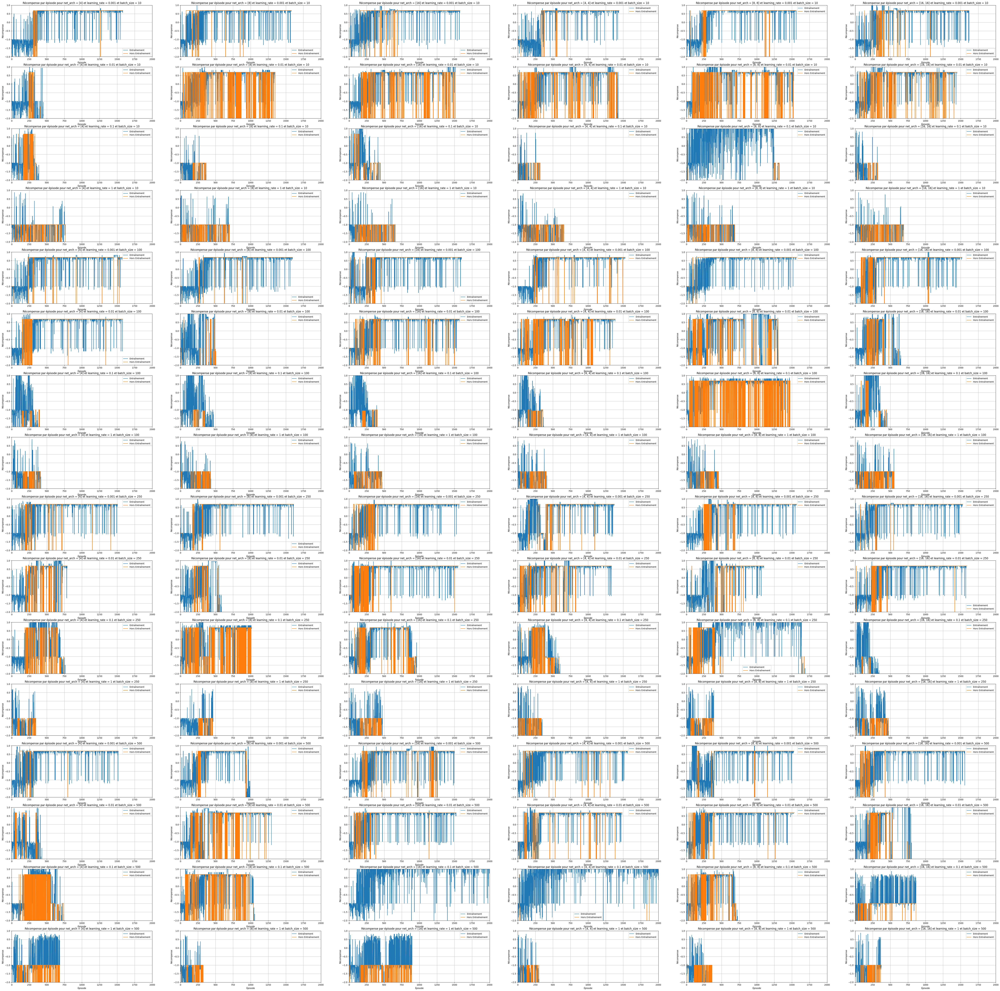

In [16]:
net_arch = [[4], [8], [16], [4, 4], [8, 8], [16, 16]]
lr = [0.001, 0.01, 0.1, 1]
batch_size = [10, 100, 250, 500]


timesteps = 10000
savePath = "Livraison_DQN_4.png"

size = 4

env = Livraison3Env(generate_random_map(size))
env.render()

plot_dqn_performance_forAll3(savePath, env, timesteps, (2000, -2, 1), 
                                    [],
                                    "net_arch", net_arch,
                                    "learning_rate", lr, 
                                    "batch_size", batch_size
                            )

.FFF
FFFF
BFHF
FFFG



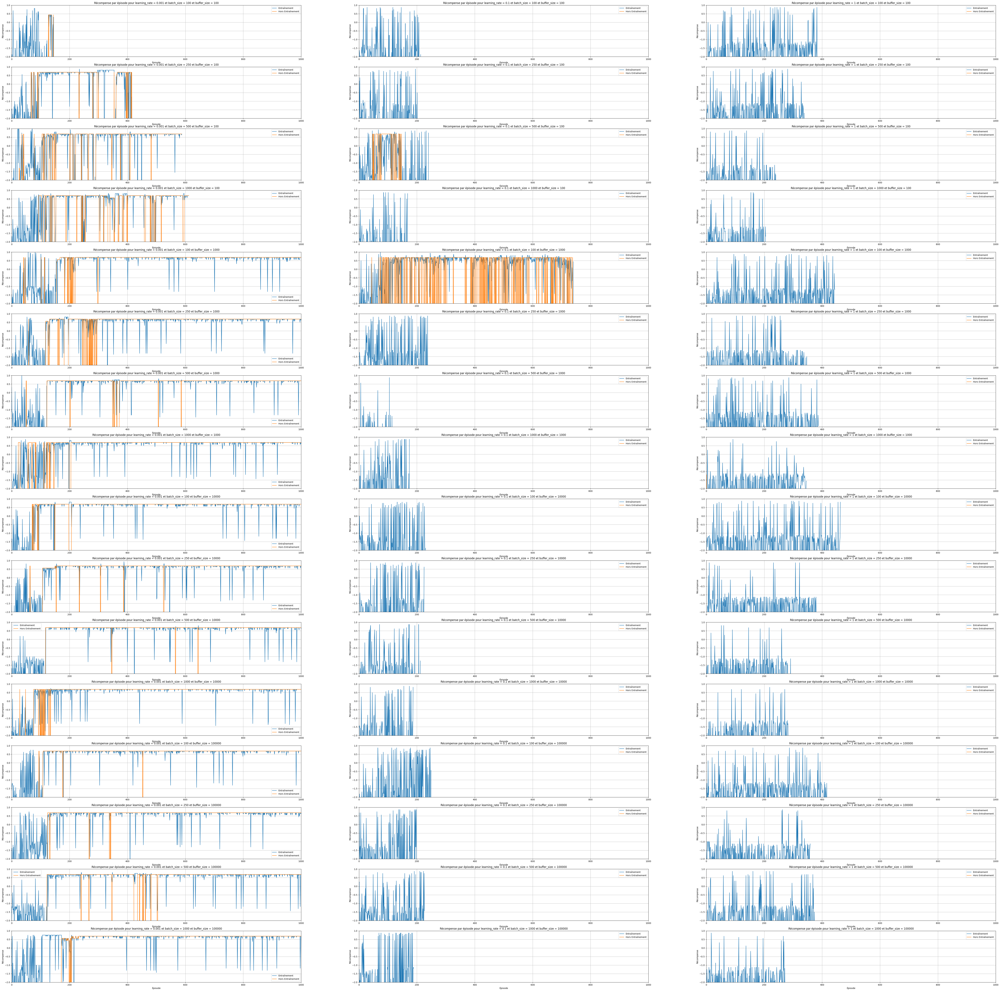

In [17]:
predefined = [('net_arch', [16])]

lr = [0.001, 0.1, 1]
batch_size = [100, 250, 500, 1000]
buffer_size = [100, 1000, 10000, 100000]

timesteps = 10000
savePath = "Livraison_DQN_4.png"

size = 4

env = Livraison3Env(generate_random_map(size))
env.render()

plot_dqn_performance_forAll3(savePath, env, timesteps, (1000, -2, 1), 
                             predefined,
                             "learning_rate", lr,
                             "batch_size", batch_size,
                             "buffer_size", buffer_size
                            )